# **Exploração de dados meteorológicos do Brasil.**
### Dados coletados pelo INMET: Instituto Nacional de Meteorologia

<br>

### **Trabalho Final - Visualização de Dados**

**Autor**: João Paulo Rodrigues Côrte

**Professor**: Felipe Lodur

<br>

### **Dados utilizados foram obtidos em:**

[Complete Brazil Weather Database - 2000/2020](https://www.kaggle.com/gbofrc/complete-brazil-weather-database-20002020)

Dados meteorológicos coletados por estações meteorológicas do Instituto Nacional de Meteorologia - INMET, distribuídas no território brasileiro no período entre 2000 e 2021.

[Catálogo de Estações Automáticas do INMET](https://portal.inmet.gov.br/paginas/catalogoaut)

Dados de localização das estações meteorológicas do INMET.

## Instalação e carregamento de bibliotecas.

In [ ]:
!pip install bar-chart-race
!pip install matplotlib
!pip install missingno
!pip install folium
!pip install --upgrade plotly

     |████████████████████████████████| 156 kB 4.9 MB/s 


In [ ]:
import csv
import glob
import itertools
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import missingno as msno
import numpy as np
import os
import pandas as pd
import random
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import bar_chart_race as bcr
import altair as alt
import requests
import folium
from branca.element import Figure

## Leitura dos dados.

Foi realizado a união entre os dados meteorológicos e a informação de localização das estações.


##### Estações meteorológicas

In [ ]:
station_file = '/content/drive/MyDrive/PUC/DATA_SCIENCE/DATAVIZ/TRABALHO/stations.csv'
stations_df = pd.read_csv(station_file, sep=';', usecols=['SG_ESTADO', 'DC_NOME', 'CD_ESTACAO', 'VL_LATITUDE', 'VL_LONGITUDE', 'VL_ALTITUDE'])

In [ ]:
col_name = {
  'SG_ESTADO': 'uf',
  'DC_NOME': 'cityname',
  'CD_ESTACAO': 'station',
  'VL_LATITUDE': 'latitude',
  'VL_LONGITUDE': 'longitude',
  'VL_ALTITUDE': 'altitude'
}

stations_df.rename(columns=col_name, inplace=True)

In [ ]:
region = {'region': ['N','N','N','N','N','N','N',
                     'NE','NE','NE','NE','NE','NE','NE','NE','NE',
                     'CO','CO','CO','CO','SE','SE','SE','SE','S','S','S'], 
          'uf': ['AM','RR','AP','PA','TO','RO','AC',
                 'MA','PI','CE','RN','PE','PB','SE','AL','BA',
                 'MT','MS','GO','DF','SP','RJ','ES','MG','PR','RS','SC']}

region_df = pd.DataFrame(region)

In [ ]:
stations_df = pd.merge(left=stations_df, right=region_df, left_on='uf', right_on='uf')

##### Unificação de dados originalmente dividido em arquivos por cidade.

**Observação:** o arquivo unificado será compartilhado.

In [ ]:
brazil_weather_path = '/content/drive/MyDrive/PUC/DATA_SCIENCE/DATAVIZ/TRABALHO/brazil weather/'

In [ ]:
os.chdir(brazil_weather_path)
file_extension = '.csv'
all_filenames = enumerate([i for i in glob.glob(f"*{file_extension}")])

all_cities_df = []

for index, row in all_filenames:
  filename = brazil_weather_path+row
  current_df = pd.read_csv(filename, sep=';', header=9)
  
  with open(filename, 'r') as file:
    csv_file = csv.reader(file, delimiter=';')
    header_list = [i for i in itertools.islice(csv_file, 9)]
    current_df['station'] = '.'.join(map(str, header_list[1])).split(': ')[1]
    all_cities_df.append(current_df)
  file.close()

weather_df = pd.concat(all_cities_df)

In [ ]:
columns = {'Data Medicao': 'date', 
           'PRECIPITACAO TOTAL, DIARIO (AUT)(mm)': 'tot_precipitation',
           'PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)': 'avg_atm_pressure',
           'TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(°C)': 'avg_dew_temp',
           'TEMPERATURA MAXIMA, DIARIA (AUT)(°C)': 'max_temp',
           'TEMPERATURA MEDIA, DIARIA (AUT)(°C)': 'avg_temp',
           'TEMPERATURA MINIMA, DIARIA (AUT)(°C)': 'min_temp',
           'UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)': 'avg_rel_humidity',
           'UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)': 'min_rel_humidity',
           'VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)': 'max_blast_wind',
           'VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)': 'avg_vel_wind'}

weather_df.rename(columns=columns, inplace=True)
weather_df.drop('Unnamed: 11', axis=1, inplace=True)

In [ ]:
weather_df = pd.merge(left=weather_df, right=stations_df, left_on='station', right_on='station')

In [ ]:
col_numbers = [
  'tot_precipitation',	'avg_atm_pressure',	'avg_dew_temp',	'max_temp',	'avg_temp',	'min_temp',	
  'avg_rel_humidity', 'min_rel_humidity',	'max_blast_wind', 'avg_vel_wind', 'latitude',	'longitude',	'altitude'
]

def asfloat_inplace(df: pd.DataFrame, columns: list):
  for col in columns:
    if df[col].dtype in [np.object, np.str]:
      df[col] = df[col].str.replace(',', '.').astype(float)

asfloat_inplace(weather_df, col_numbers)

In [ ]:
all_cities_file = '/content/drive/MyDrive/PUC/DATA_SCIENCE/DATAVIZ/TRABALHO/weather.csv'
weather_df.to_csv(all_cities_file, index=False)

##### Dados meteorológicos do Brasil Unificados.

Os arquivos originais são divididos por cidade.

O link abaixo possui os dados de todas as cidades unificados.

[Dataset Unificado](https://drive.google.com/file/d/1iUIfjAa5InuExemh2jT9WNRnQestVlj2/view?usp=sharing)

In [ ]:
all_cities_file = '/content/drive/MyDrive/PUC/DATA_SCIENCE/DATAVIZ/TRABALHO/weather.csv'
weather_df = pd.read_csv(all_cities_file)

## 1. Identificando os dados faltantes.

Utilização da biblioteca `missingno` para identificar e visualizar dados ausentes.

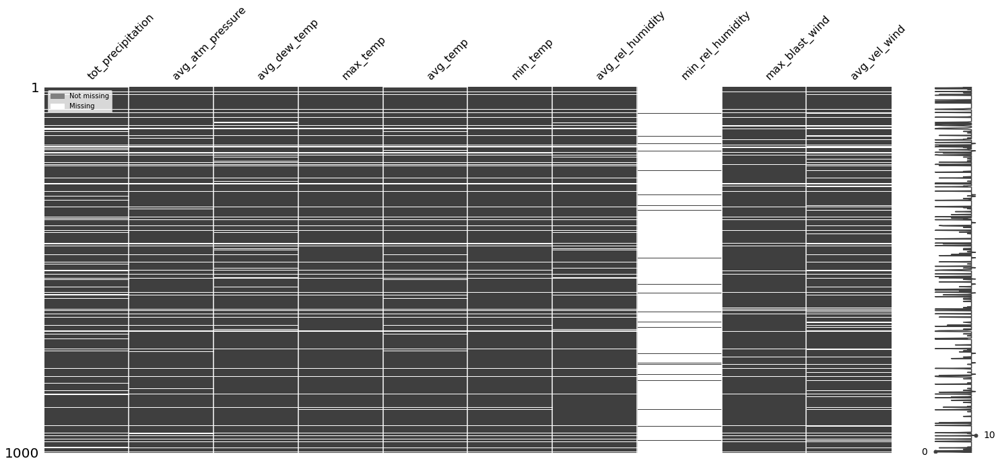

In [ ]:
df = weather_df.loc[:, ['tot_precipitation', 'avg_atm_pressure', 'avg_dew_temp',
                                   'max_temp', 'avg_temp', 'min_temp', 'avg_rel_humidity',
                                   'min_rel_humidity', 'max_blast_wind', 'avg_vel_wind']]

msno.matrix(df.sample(1000))
gray_patch = mpatches.Patch(color='gray', label='Not missing')
white_patch = mpatches.Patch(color='white', label='Missing')
plt.legend(handles=[gray_patch, white_patch], loc='upper left')
plt.show()

## 2. Identificação de posições dos locais analisados.

De acordo com as informações de Latitude e Longitude podemos identificar a localização das estações de medição.

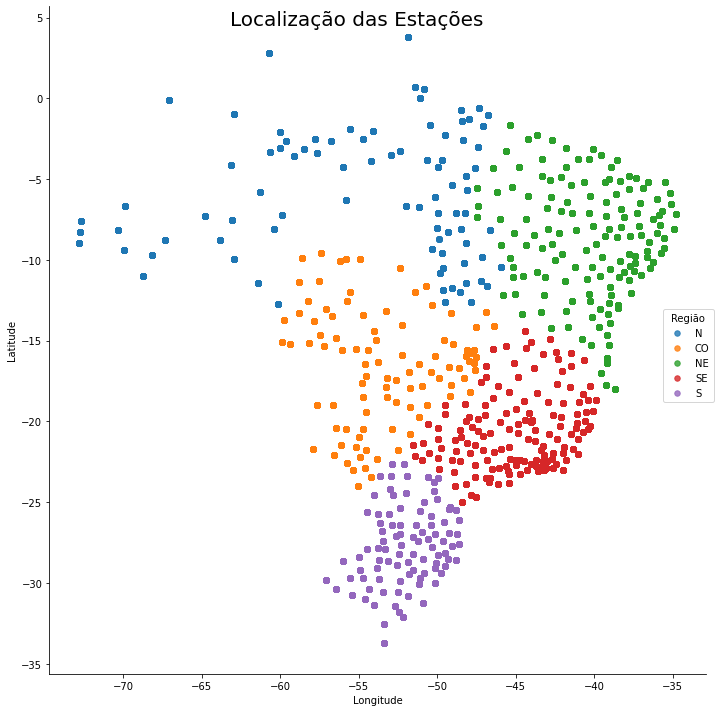

In [ ]:
df = weather_df.copy()

df = df.drop(df.columns.difference(['longitude', 'latitude', 'region']), axis=1)
df = df.loc[df['latitude'] > -40]

stations = sns.lmplot(x="longitude", y="latitude", data=df, fit_reg=False, 
                      legend=False, scatter_kws={"s": 30}, hue='region', height=10)

stations.set(xlabel='Longitude', ylabel='Latitude')
stations.fig.suptitle('Localização das Estações', fontsize=20)
stations.fig.legend(labels=weather_df.region.unique(), loc='center right', title='Região')

plt.show()

## 3. Análise da correlação entre os dados.

Exibição do mapa de calor traçando a correlação entre as colunas. Além disso, será removido a repetição plotando apenas os elementos da diagonal inferior. 

O gráfico exibirá apenas os valores para as correlações menores que -0.25 e maiores que 0.25.

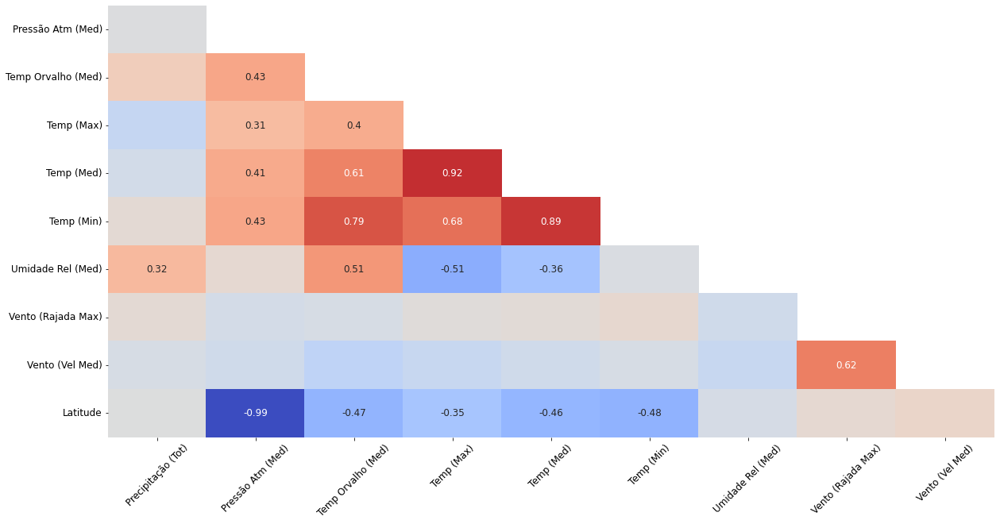

In [ ]:
df = weather_df.loc[:, ['tot_precipitation', 'avg_atm_pressure', 'avg_dew_temp',
                        'max_temp', 'avg_temp', 'min_temp', 'avg_rel_humidity',
                        'max_blast_wind', 'avg_vel_wind',
                        'altitude']]

df.dropna(inplace=True)
df.drop_duplicates(inplace=True)

df = df.corr()
df = df.iloc[1:,:-1]
   
mask = np.triu(np.ones_like(df), k=1)
    
plt.figure(figsize=(20,10))

col_names = ['tot_precipitation', 'avg_atm_pressure', 'avg_dew_temp', 'max_temp',
       'avg_temp', 'min_temp', 'avg_rel_humidity', 'min_rel_humidity',
       'max_blast_wind', 'avg_vel_wind', 'latitude', 'longitude']

x_axis_labels = ['Precipitação (Tot)', 'Pressão Atm (Med)', 'Temp Orvalho (Med)', 
                 'Temp (Max)', 'Temp (Med)', 'Temp (Min)', 'Umidade Rel (Med)', 
                 'Vento (Rajada Max)', 'Vento (Vel Med)']

y_axis_labels = ['Pressão Atm (Med)', 'Temp Orvalho (Med)', 
                 'Temp (Max)', 'Temp (Med)', 'Temp (Min)', 'Umidade Rel (Med)', 
                 'Vento (Rajada Max)', 'Vento (Vel Med)', 'Latitude']

ax = sns.heatmap(df, vmin=-1, vmax=1, cbar=False,
                 cmap='coolwarm', mask=mask, annot=True, 
                 xticklabels=x_axis_labels, yticklabels=y_axis_labels)

for text in ax.texts:
  value = float(text.get_text())
  if (-0.25 < value < 0.25):
    text.set_text('')
  else:
    text.set_text(round(value, 2))
  text.set_fontsize('12')

plt.xticks(rotation=45, size='12')
plt.yticks(size='12')
plt.show()

## 4. Variação de Temperatura Máxima no Brasil (por mês)

Podemos perceber que a temperatura máxima no Brasil atinge o maior valor entre os meses de outubro a fevereiro. Porém se considerarmos cada região do Brasil podemos perceber que a maior temperatura é atingida em diferentes meses do ano.

##### Leitura e tratamento dos dados.

In [ ]:
df = weather_df.loc[:,['max_temp', 'date', 'region']]
df.dropna(inplace=True)
df['month'] = pd.DatetimeIndex(df['date']).month

region = {'region': ['N', 'NE', 'CO', 'SE','S'], 
          'region_name': ['Norte','Nordeste','Centro Oeste','Sudeste','Sul']}
region_df = pd.DataFrame(region)
df = pd.merge(left=df, right=region_df, left_on='region', right_on='region')

df = df.sort_values(by=['month'])

##### Temperatura Máxima no Brasil.

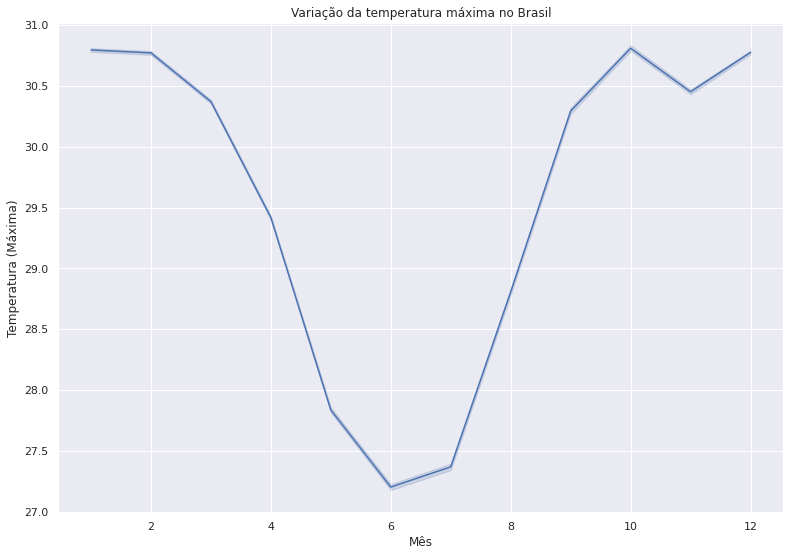

In [ ]:
sns.set(rc={'figure.figsize':(13,9)})
ax = sns.lineplot(y="max_temp", x="month", data=df)
ax.set(xlabel='Mês', ylabel='Temperatura (Máxima)', title='Variação da temperatura máxima no Brasil')
plt.show()

##### Temperatura Máxima por regiões do Brasil.

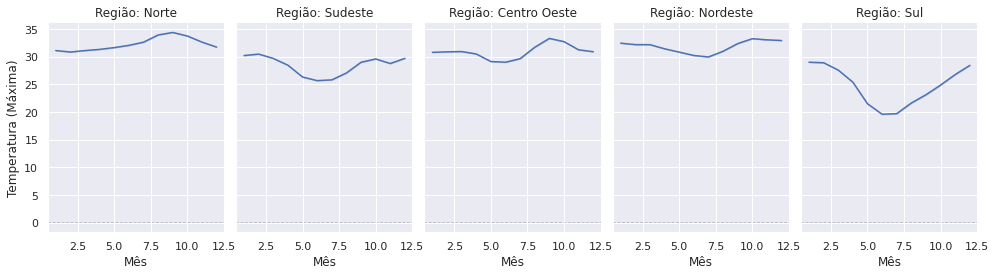

In [ ]:
g = sns.relplot(data=df,
                x="month", y="max_temp",
                col="region_name", height=4, aspect=.7, kind="line"
)
(g.map(plt.axhline, y=0, color=".7", dashes=(2, 1), zorder=0)
  .set_axis_labels("Mês", "Temperatura (Máxima)")
  .set_titles("Região: {col_name}")
  .tight_layout(w_pad=0))

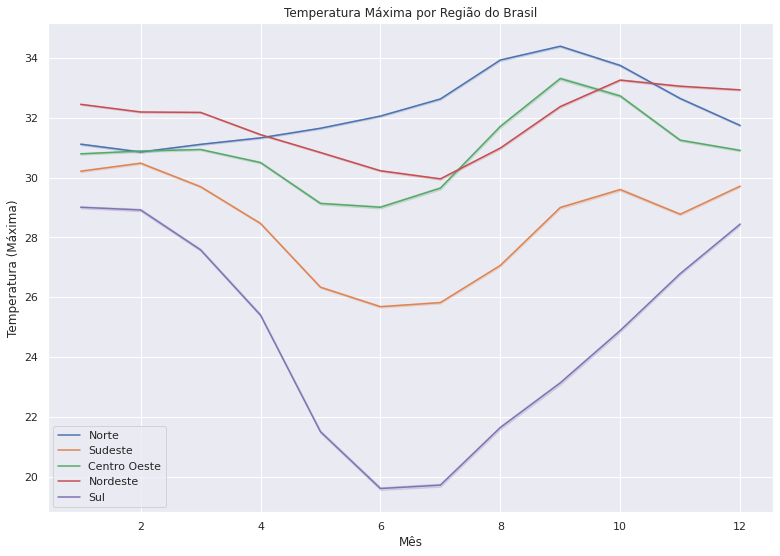

In [ ]:
sns.set(rc={'figure.figsize':(13,9)})
ax = sns.lineplot(y="max_temp", x="month", data=df, hue='region_name')
ax.set(xlabel='Mês', ylabel='Temperatura (Máxima)', title='Temperatura Máxima por Região do Brasil')
ax.legend().set_title('')
plt.show()

### 5. Variáveis por região (Média)
Verificando a média de algumas variáveis podemos observar que há grandes variações por região. Um exemplo é a precipitação média na região Nordeste é consideravelmente menor que as demais regiões.


##### Leitura e montagem

In [ ]:
df = weather_df.loc[:, ['tot_precipitation', 'avg_atm_pressure', 'avg_dew_temp',
                        'avg_temp', 'avg_rel_humidity', 'altitude', 'region']]
df.dropna(inplace=True)

columns = {'tot_precipitation': 'Precipitação (Total)', 
           'avg_atm_pressure': 'Pressão Atmosférica (Med)', 
           'avg_dew_temp': 'Temp Orvalho (Med)', 
           'avg_temp': 'Temp (Med)', 
           'avg_rel_humidity': 'Umidade Rel (Med)', 
           'altitude': 'Altitude'}

df.rename(columns=columns, inplace=True)

region = {'region': ['N', 'NE', 'CO', 'SE','S'], 
          'region_name': ['Norte','Nordeste','Centro Oeste','Sudeste','Sul']}

region_df = pd.DataFrame(region)
df = pd.merge(left=df, right=region_df, left_on='region', right_on='region')

df = df.groupby(['region_name']).mean()
df.reset_index(level=0, inplace=True)

regions=df.region_name.unique()

fig = go.Figure(
    data=[
        go.Bar(name='Precipitação',        x=regions, y=df['Precipitação (Total)'],      yaxis='y',  offsetgroup=1),
        go.Bar(name='Pressão Atmosférica', x=regions, y=df['Pressão Atmosférica (Med)'], yaxis='y2', offsetgroup=2),
        go.Bar(name='Temp Orvalho',        x=regions, y=df['Temp Orvalho (Med)'],        yaxis='y3', offsetgroup=3),
        go.Bar(name='Temperatura',         x=regions, y=df['Temp (Med)'],                yaxis='y4', offsetgroup=4),
        go.Bar(name='Umidade Rel',         x=regions, y=df['Umidade Rel (Med)'],         yaxis='y5', offsetgroup=5),
    ],
    layout={
        'yaxis':  {'title': '', 'visible': False, 'showticklabels': False,},
        'yaxis2': {'title': '', 'overlaying': 'y', 'side': 'right', 'visible': False, 'showticklabels': False},
        'yaxis3': {'title': '', 'overlaying': 'y', 'side': 'right', 'visible': False, 'showticklabels': False},
        'yaxis4': {'title': '', 'overlaying': 'y', 'side': 'right', 'visible': False, 'showticklabels': False},
        'yaxis5': {'title': '', 'overlaying': 'y', 'side': 'right', 'visible': False, 'showticklabels': False},
    }
)

##### Exibição

In [ ]:
fig.update_layout(barmode='group')
fig.show(renderer="colab")

## 6. Variação da Umidade Relativa do Ar (Média)

##### Leitura e tratamento dos dados.

In [ ]:
df = weather_df.loc[:,['date', 'avg_rel_humidity', 'region', 'uf']]
df.dropna(inplace=True)

region = {'region': ['N', 'NE', 'CO', 'SE','S'], 
          'region_name': ['Norte','Nordeste','Centro Oeste','Sudeste','Sul']}

region_df = pd.DataFrame(region)
df = pd.merge(left=df, right=region_df, left_on='region', right_on='region')

df = df.sample(100000)

### Exibição por Região.

Podemos observar que a região Norte possui intervalo interquartil menor que as outras regiões. Vemos também que o valor minimo é bem elevado quando comparado com as outras regiões. O que gera uma grande faixa de outliers.

In [ ]:
fig = go.Figure()

fig.add_trace(go.Box(x=df['region_name'], y=df['avg_rel_humidity'],
                     notched=False))

fig.update_layout(boxmode='group')
fig.show(renderer="colab")

### Exibição (Região Norte).

Quando analisamos os estados da região norte observamos apenas o estado de Tocantins com dados divergentes dos dados da região. Apresentando amplitude e intervalo interquartil maiores.

In [ ]:
fig = go.Figure()

nort_df = df.loc[df['region'] == 'N',:]

fig = go.Figure()

fig.add_trace(go.Box(x=nort_df['uf'], y=nort_df['avg_rel_humidity'],
                     notched=False))

fig.update_layout(boxmode='group')
fig.show(renderer="colab")

### Exibição por Estados.

Em geral os estados apresentam informações semelhantes aos dados da região, havendo algumas exceções que podem ser facilmente identificadas.

In [ ]:
fig = go.Figure()

for i, region in enumerate(df['region_name'].unique()):
    df_plot = df[df['region_name']==region]
    
    fig.add_trace(go.Box(x=df_plot['uf'], y=df_plot['avg_rel_humidity'],
                         notched=False,
                         name='Região: ' + region))

fig.update_layout(boxmode='group')
fig.show(renderer="colab")

## 7. Acumulado de chuvas no Brasil.

##### Leitura e tratamento dos dados.

In [ ]:
df = weather_df.loc[:,['date', 'tot_precipitation', 'region', 'uf']]
df.dropna(inplace=True)
df = df.sample(100000)

df['year_month'] = pd.to_datetime(df['date']).dt.to_period('M')

region = {'region': ['N', 'NE', 'CO', 'SE','S'], 
          'region_name': ['Norte','Nordeste','Centro Oeste','Sudeste','Sul']}

region_df = pd.DataFrame(region)
df = pd.merge(left=df, right=region_df, left_on='region', right_on='region')

df = df.sort_values(by=['year_month'])

### Acumulado por Região.

##### Montagem

In [ ]:
region_df = df.copy()

region_df = region_df.pivot_table(values='tot_precipitation', index = ['year_month'], columns = 'region_name')
region_df = region_df.fillna(0)

region_df.sort_values(list(region_df.columns),inplace=True)
region_df = region_df.sort_index()

region_df.iloc[:, 0:-1] = region_df.iloc[:, 0:-1].cumsum()

top_rainning = set()
for index, row in region_df.iterrows():
    top_rainning |= set(row[row > 0].sort_values(ascending=False).index)

region_df = region_df[top_rainning]

In [ ]:
%%capture
chart = bcr.bar_chart_race(df=region_df, 
                           n_bars=5,
                           sort='desc',
                           title='Acumulado de chuva por regiões do Brasil',
                           title_size=10,
                           bar_kwargs={'alpha': .7})

##### Exibição

In [ ]:
chart

### Acumulado por estados das regiões Sudeste e centro-Oeste.

##### Montagem

In [ ]:
uf_df = df.loc[df['region'].isin(['NE']),:]

uf_df = uf_df.pivot_table(values='tot_precipitation', index = ['year_month'], columns = 'uf')
uf_df = uf_df.fillna(0)

uf_df.sort_values(list(uf_df.columns),inplace=True)
uf_df = uf_df.sort_index()

uf_df.iloc[:, 0:-1] = uf_df.iloc[:, 0:-1].cumsum()

top_rainning = set()
for index, row in uf_df.iterrows():
    top_rainning |= set(row[row > 0].sort_values(ascending=False).index)

uf_df = uf_df[top_rainning]

In [ ]:
%%capture
chart = bcr.bar_chart_race(df=uf_df, 
                           n_bars=9,
                           sort='desc',
                           title='Acumulado de chuva por estados da região Nordeste',
                           title_size=10,
                           bar_kwargs={'alpha': .7})

##### Exibição

In [ ]:
chart

## 8. Relação entre Precipitação e Temperatura Máxima.

Comparação entre três cidades brasileiras exibindo a relação entre temperatura e a quantidade de chuvas.

### Porto Alegre - RS

Cidade com temperatura definidas de acordo com as estações do ano. Podemos perceber também que as chuvas acontecem durante todo o ano e que historicamente a quantidade de dias sem chuva é maior que a quantidade de dias com chuva.

##### Montagem

In [ ]:
df = weather_df.loc[(weather_df['cityname'].isin(['PORTO ALEGRE'])),['cityname', 'date', 'tot_precipitation', 'max_temp']]
df = df.dropna()

df = df.sample(5000)

df['weather'] = ''

for i in range(len(df)):
  df.iloc[i, 4] = ('Com chuva' if (df.iloc[i, 2] > 0) else 'Sem chuva')

scale = alt.Scale(domain=['Sem chuva', 'Com chuva'],
                  range=['#d4571e', '#211ed4'])
color = alt.Color('weather:N', scale=scale, title='Clima')

brush = alt.selection_interval(encodings=['x'])
click = alt.selection_multi(encodings=['color'])

points = alt.Chart().mark_point().encode(
    alt.X('monthdate(date):T', title='Data'),
    alt.Y('max_temp:Q',
        title='Temperatura Máxima Diaria (C)',
        scale=alt.Scale(domain=[8, 38])
    ),
    color=alt.condition(brush, color, alt.value('lightgray')),
    size=alt.Size('tot_precipitation:Q', scale=alt.Scale(range=[5, 200]), title='Precipitação')
).properties(
    width=880,
    height=500
).add_selection(
    brush
).transform_filter(
    click
)

bars = alt.Chart().mark_bar().encode(
    x='count()',
    y=alt.Y('weather:N',
            title='Clima'),
    color=alt.condition(click, color, alt.value('lightgray')),
).transform_filter(
    brush
).properties(
    width=880
).add_selection(
    click
)

##### Exibição

In [ ]:
alt.vconcat(
    points,
    bars,
    data=df,
    title="Porto Alegre: Precipitação x Temperatura Máxima",
)

alt.VConcatChart(...)

### Teresina - PI

Teresina apresenta temperaturas maiores entre os meses de Setembro e Dezembro. Possui período chuvoso acontece entre Janeiro e Maio, apresentando mais que o dobro de dias sem chuva.

##### Montagem

In [ ]:
df = weather_df.loc[(weather_df['cityname'].isin(['TERESINA'])),['cityname', 'date', 'tot_precipitation', 'max_temp']]
df = df.dropna()

df['weather'] = ''

for i in range(len(df)):
  df.iloc[i, 4] = ('Com chuva' if (df.iloc[i, 2] > 0) else 'Sem chuva')

scale = alt.Scale(domain=['Sem chuva', 'Com chuva'],
                  range=['#d4571e', '#211ed4'])
color = alt.Color('weather:N', scale=scale, title='Clima')

brush = alt.selection_interval(encodings=['x'])
click = alt.selection_multi(encodings=['color'])

points = alt.Chart().mark_point().encode(
    alt.X('monthdate(date):T', title='Data'),
    alt.Y('max_temp:Q',
        title='Temperatura Máxima Diaria (C)',
        scale=alt.Scale(domain=[25, 42])
    ),
    color=alt.condition(brush, color, alt.value('lightgray')),
    size=alt.Size('tot_precipitation:Q', scale=alt.Scale(range=[5, 200]), title='Precipitação')
).properties(
    width=880,
    height=500
).add_selection(
    brush
).transform_filter(
    click
)

bars = alt.Chart().mark_bar().encode(
    x='count()',
    y=alt.Y('weather:N',
            title='Clima'),
    color=alt.condition(click, color, alt.value('lightgray')),
).transform_filter(
    brush
).properties(
    width=880
).add_selection(
    click
)

##### Exibição

In [ ]:
alt.vconcat(
    points,
    bars,
    data=df,
    title="Teresina: Precipitação x Temperatura Máxima",
)

alt.VConcatChart(...)

### Belem - PA

Historicamente, a quantidade de dias sem chuva em Belem é 1/3 dos dias chuvosos. Belem apresenta temperaturas menores entre os meses de Dezembro e Maio, que são os meses que acontece as maiores quantidades de chuva. Podemos perceber também que em Dezembro e Janeiro ocorrem alguns dias com altas temperaturas, ultrapassando a marca de 40º Celsius.

##### Montagem

In [ ]:
df = weather_df.loc[(weather_df['cityname'].isin(['BELEM'])),['cityname', 'date', 'tot_precipitation', 'max_temp']]
df = df.dropna()
df = df.sample(5000)

df['weather'] = ''

for i in range(len(df)):
  df.iloc[i, 4] = ('Com chuva' if (df.iloc[i, 2] > 0) else 'Sem chuva')

scale = alt.Scale(domain=['Sem chuva', 'Com chuva'],
                  range=['#d4571e', '#211ed4'])
color = alt.Color('weather:N', scale=scale, title='Clima')

brush = alt.selection_interval(encodings=['x'])
click = alt.selection_multi(encodings=['color'])

points = alt.Chart().mark_point().encode(
    alt.X('monthdate(date):T', title='Data'),
    alt.Y('max_temp:Q',
        title='Temperatura Máxima Diaria (C)',
        scale=alt.Scale(domain=[24, 40])
    ),
    color=alt.condition(brush, color, alt.value('lightgray')),
    size=alt.Size('tot_precipitation:Q', scale=alt.Scale(range=[5, 200]), title='Precipitação')
).properties(
    width=880,
    height=500
).add_selection(
    brush
).transform_filter(
    click
)

bars = alt.Chart().mark_bar().encode(
    x='count()',
    y=alt.Y('weather:N',
            title='Clima'),
    color=alt.condition(click, color, alt.value('lightgray')),
).transform_filter(
    brush
).properties(
    width=880
).add_selection(
    click
)

##### Exibição

In [ ]:
alt.vconcat(
    points,
    bars,
    data=df,
    title="Belem: Precipitação x Temperatura Máxima",
)

alt.VConcatChart(...)

## 9. Total de precipitação na capitais do Brasil.

Total de Precipitação das capitais brasileiras representado pelo tamanho dos pontos no mapa.

##### Montagem

In [ ]:
capitals = [
  'Porto Velho', 'Manaus', 'Rio Branco', 'Campo Grande', 'Macapa', 'Brasilia',
  'Boa Vista', 'Cuiaba', 'Palmas', 'Sao Paulo', 'Teresina', 'Rio de Janeiro',
  'Belem', 'Goiania', 'Salvador', 'Florianopolis', 'São Luis', 'Maceio',
  'Porto Alegre', 'Curitiba', 'Belo Horizonte', 'Fortaleza', 'Recife', 
  'Joao Pessoa', 'Aracaju', 'Natal', 'Vitoria']
capitals = [name.upper() for name in capitals]

df = weather_df.loc[weather_df['cityname'].isin(capitals),['date', 'tot_precipitation', 'cityname']]
df['year'] = pd.DatetimeIndex(df['date']).year
df = df.loc[df['year'] == 2020,:]
df = df.groupby(['cityname'])['tot_precipitation'].sum().reset_index()

location = weather_df.loc[:,['cityname', 'latitude',	'longitude']]
df = pd.merge(left=location, right=df, left_on='cityname', right_on='cityname')
df = df.drop_duplicates()

fig = Figure(width=800, height=600)

chart = folium.Map(width=800, height=600,
                   location=[-16, -49], zoom_start = 3, 
                   tiles = "cartodbpositron")

for i in range(0,len(df)):
    popup_text = """Cidade: {}<br>
                    Acumulado de chuvas: {:.2f}<br>"""
    popup_text = popup_text.format(df.iloc[i]['cityname'],
                    df.iloc[i]['tot_precipitation'])
    folium.Circle(
      location=[df.iloc[i]['latitude'], df.iloc[i]['longitude']],
      radius = float(df.iloc[i]['tot_precipitation'])*70,
      popup = popup_text,
      color = 'red',
      fill=True,
      fill_color='blue'
   ).add_to(chart)

##### Exibição

In [ ]:
fig.add_child(chart)

## 10. Total de Precipitação x Altitude

Representação de Total de Precipitação em todas as cidade brasileiras, relacionadas com a altitude.

As cidades são apresentadas por estado/região do Brasil.

##### Montagem

In [ ]:
df = weather_df.loc[:,['tot_precipitation', 'altitude', 'avg_atm_pressure', 'region', 'uf', 'cityname', 'station']]
df.dropna(inplace=True)

precipitation_df = df.groupby(['cityname', 'station', 'uf', 'region'])['tot_precipitation'].sum().reset_index()
altitude_df = df.groupby(['cityname', 'station', 'uf', 'region'])['altitude'].mean().reset_index()
atm_pressure_df = df.groupby(['cityname', 'station', 'uf', 'region'])['avg_atm_pressure'].mean().reset_index()

df = pd.merge(precipitation_df, altitude_df, how='inner', left_on=['cityname', 'station', 'uf', 'region'], right_on=['cityname', 'station', 'uf', 'region'])
df = pd.merge(df, atm_pressure_df, how='inner', left_on=['cityname', 'station', 'uf', 'region'], right_on=['cityname', 'station', 'uf', 'region'])

region = {'region': ['N', 'NE', 'CO', 'SE','S'], 
          'region_name': ['Norte','Nordeste','Centro Oeste','Sudeste','Sul']}
region_df = pd.DataFrame(region)

df = pd.merge(left=df, right=region_df, left_on='region', right_on='region')

##### exibição

In [ ]:
fig = px.treemap(df, path=[px.Constant('brazil'), 'region', 'uf', 'cityname'], values='tot_precipitation',
                  color='altitude')
fig.show()